To do : 
- We stay on the "full" version of the data for now (with baseline) 
- Find a set of parameters for the TF analysis that doesn't include every time points, for example 20 ms  ; then the temporal dimension should look like : 40 to 60 ms, 60 to 80 ms, 80 to 100 ms, 100 to 120 ms, 120 to 140 ms for the post stim
- Perform clustering analysis separately for each of these 20 ms wide time windows, on phase / frequency data
- frequency domain : 8 Hz to 28 Hz 
- How to go to the group level ? If we find clusters, we could use centroids the group level.




In [1]:
import scipy.io as sio
from matplotlib import pyplot as plt 
%matplotlib inline


In [2]:
#matfile = '/run/media/nfarrugi/ECHACHACHOU/PD_phase/data_probands_beta_noselec_p50_Cz_6_Hz.mat'
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_probands_beta_noselec_p50_Cz.mat'

In [3]:
filecontents = sio.whosmat(matfile)
print(filecontents)

[('plv_subj_01k1', (1, 1), 'struct'), ('plv_subj_02k1', (1, 1), 'struct'), ('plv_subj_03k1', (1, 1), 'struct'), ('plv_subj_04k1', (1, 1), 'struct'), ('plv_subj_05k1', (1, 1), 'struct'), ('plv_subj_06k1', (1, 1), 'struct'), ('plv_subj_07k1', (1, 1), 'struct'), ('plv_subj_08k1', (1, 1), 'struct'), ('plv_subj_09k1', (1, 1), 'struct'), ('plv_subj_10k1', (1, 1), 'struct'), ('plv_subj_11k1', (1, 1), 'struct'), ('plv_subj_12k1', (1, 1), 'struct'), ('plv_subj_13k1', (1, 1), 'struct'), ('plv_subj_14k1', (1, 1), 'struct'), ('plv_subj_15k1', (1, 1), 'struct'), ('plv_subj_16k1', (1, 1), 'struct'), ('plv_subj_17k1', (1, 1), 'struct'), ('plv_subj_18k1', (1, 1), 'struct'), ('plv_subj_19k1', (1, 1), 'struct'), ('plv_subj_20k1', (1, 1), 'struct')]


Let's pick one subject randomly

In [4]:
import numpy as np 

cursubjname = filecontents[np.random.randint(20)][0]
print(cursubjname)

plv_subj_10k1


Load this subject

In [6]:
subjdata = sio.loadmat(matfile,variable_names=cursubjname,struct_as_record = False,squeeze_me=True)[cursubjname]

We can now directly access all the fields of the struct directly like in Matlab

In [7]:
subjdata.all.iso.standard.time

array([-0.2 , -0.18, -0.16, -0.14, -0.12, -0.1 , -0.08, -0.06, -0.04,
       -0.02,  0.  ,  0.02,  0.04,  0.06,  0.08,  0.1 ,  0.12,  0.14,
        0.16,  0.18,  0.2 ])

In [8]:
allfreqs  = np.round(subjdata.all.iso.standard.freq)
print(allfreqs)

[  8.   9.  10.  11.  12.  13.  14.  15.  16.  17.  18.  19.  20.  21.  22.
  23.  24.  25.  26.  27.  28.]


In [9]:
subjdata.all.iso.standard.label

array(['Fz', 'Cz', 'Pz'], dtype=object)

We choose the time point here

In [10]:
tpoint = 14

tpoint_ms = subjdata.all.iso.standard.time[tpoint]
p50_cz_iso_std = subjdata.all.iso.standard.ang[:,1,:,tpoint]
p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,1,:,tpoint]

print("Examining at %0.2f ms" % tpoint_ms)

Examining at 0.08 ms


Clustering tests on raw angle data 
--

In this section, we are doing some basic clustering tests on specific time points, by looking at distributions of frequencies - at one specific time point, we see frequencies as features, and investigate whether the variability across trials can distinguish REGULAR vs IRREGULAR

The dimensionality of our is 21 (21 frequencies). We will attempt to use manifold learning methods in order to visualize the phase-frequency in a low-dimensional space (2 or 3). 

**Thus we are directly trying to identify clusters in a low-dimensional space**

*Dimensionality reduction*  using Local Tangent Space Alignement (LTSA). 

(“Principal manifolds and nonlinear dimensionality reduction via tangent space alignment” Zhang, Z. & Zha, H. Journal of Shanghai Univ. 8:406 (2004)) 


Learning 2D projections 
--

Red points : REGULAR 

Grey points : IRREGULAR

Controls

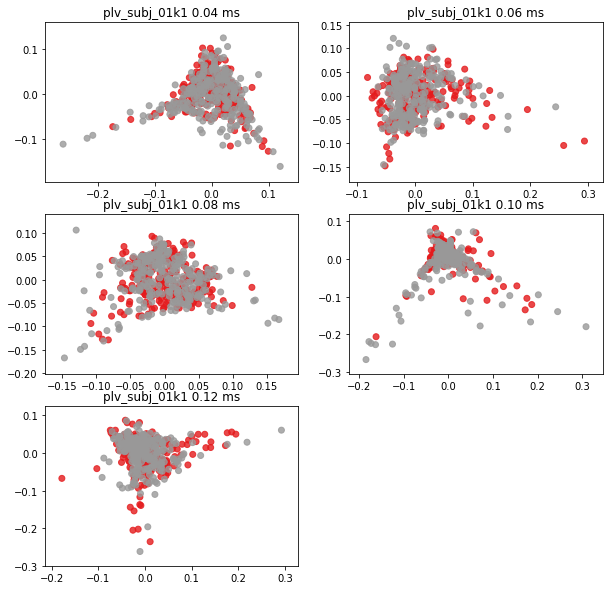

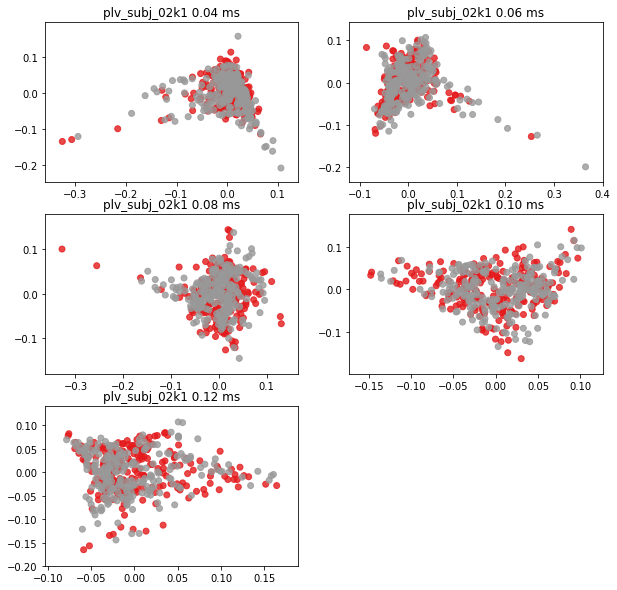

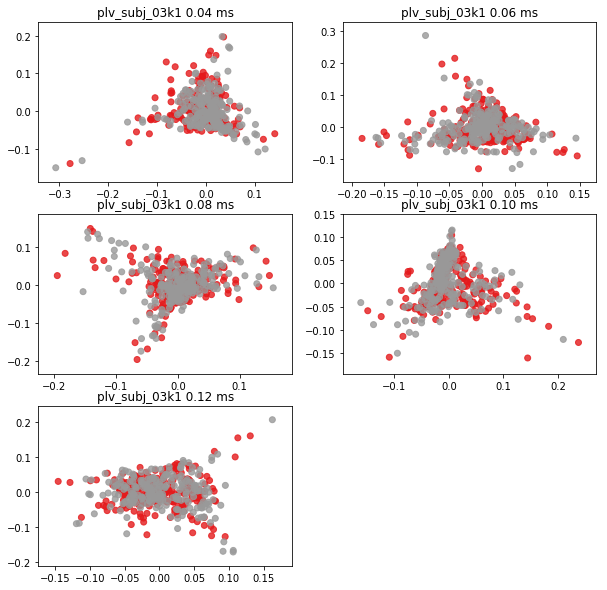

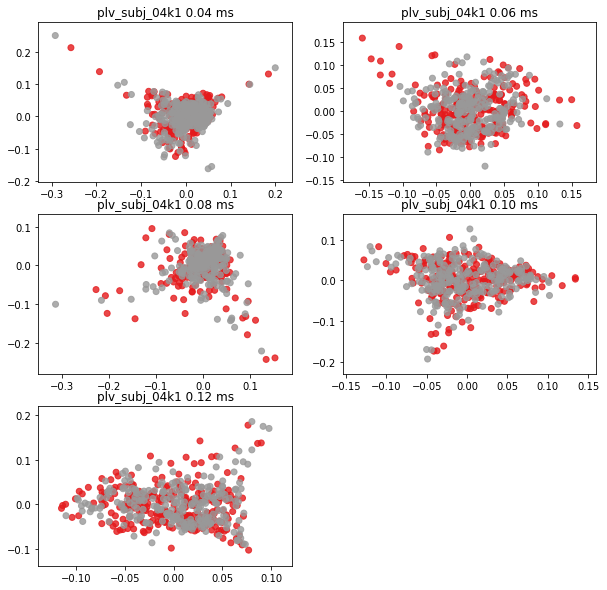

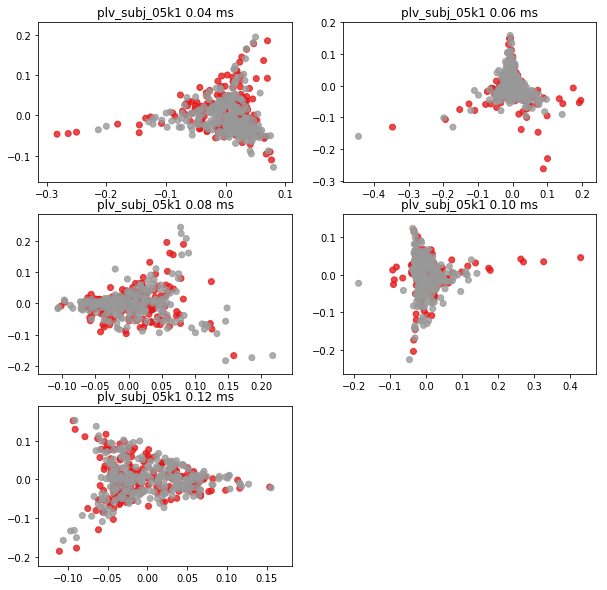

...

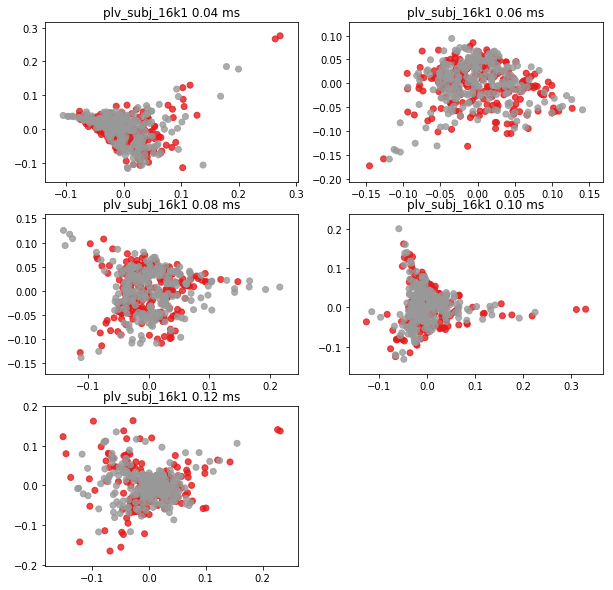

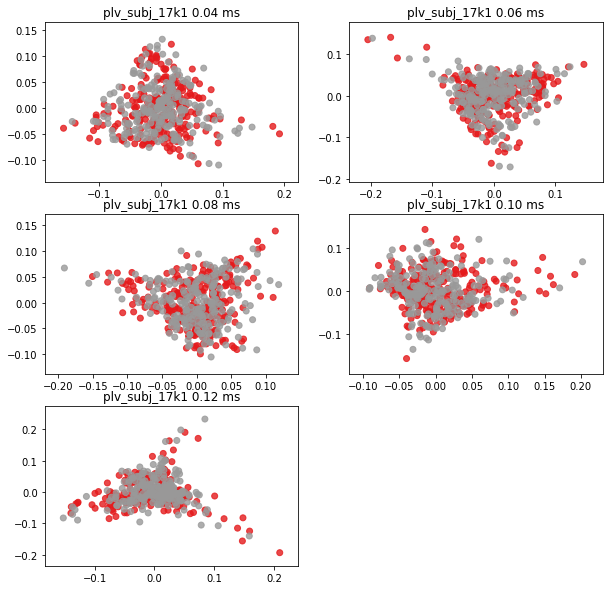

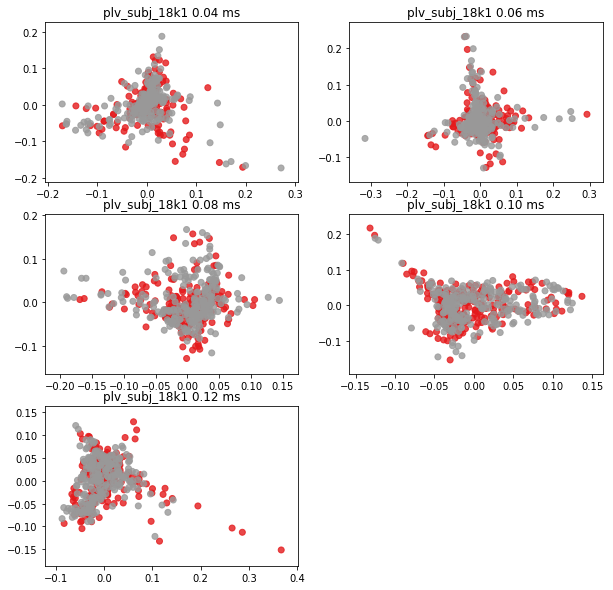

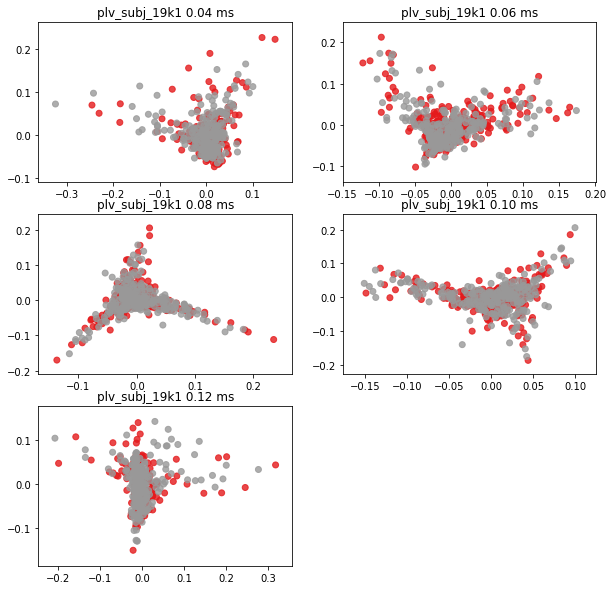

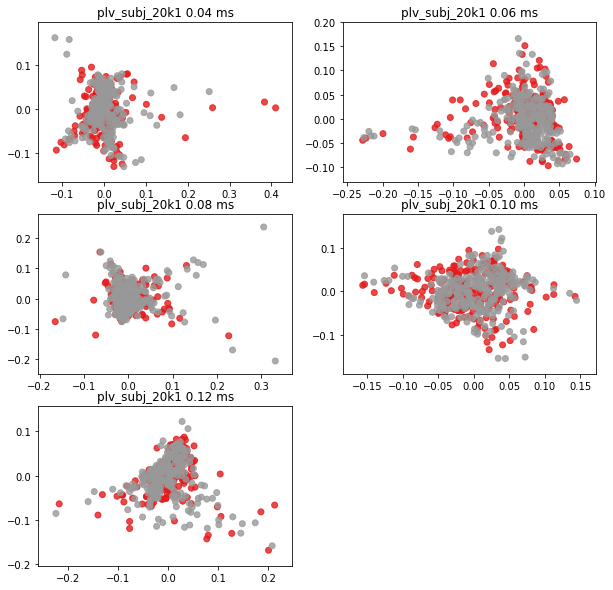

In [562]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_probands_beta_noselec_p50_Cz.mat'

filecontents = sio.whosmat(matfile)

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    plt.figure(figsize=(10,10))
    
    for k,tpoint in enumerate(range(12,17)):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1

        
        
        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))
        
        
        #X = (np.vstack([p50_cz_iso_std,p50_cz_rnd_std]))


        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        n_neighbors = 8
        n_components = 2

        plt.subplot(3,2,k+1)


        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
        Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='standard',eigen_solver='dense').fit_transform(X)

        plt.scatter(Y[:, 0], Y[:, 1],c=y,alpha=0.8,cmap=plt.cm.Set1)
        plt.title('%s %0.2f ms' % (current_subj,tpoint_ms))

Patients

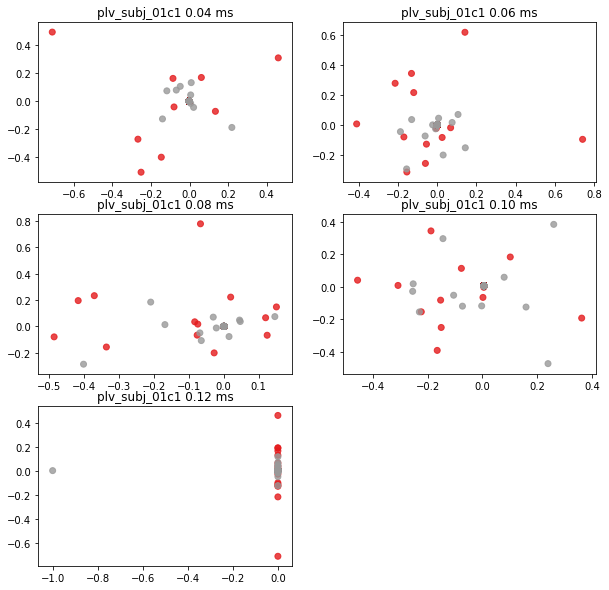

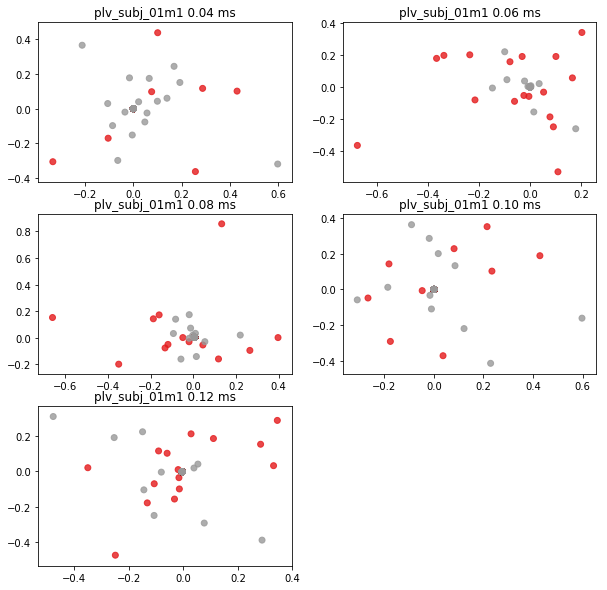

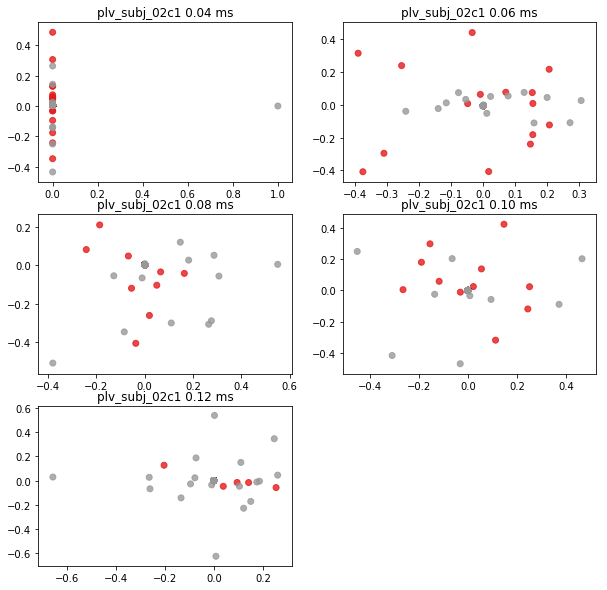

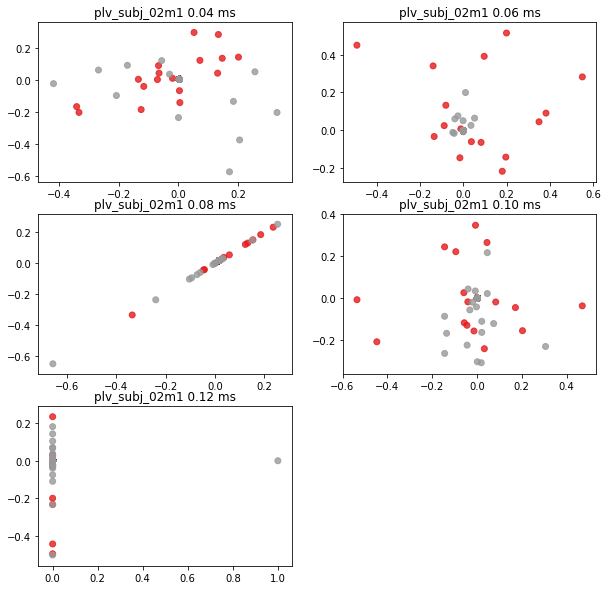

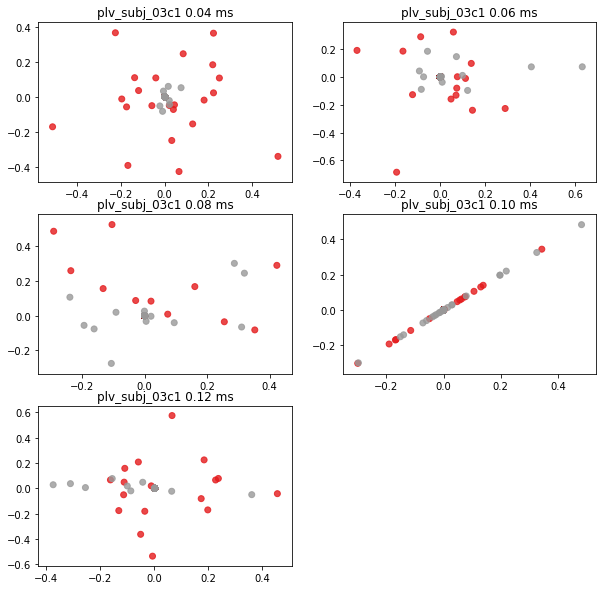

...

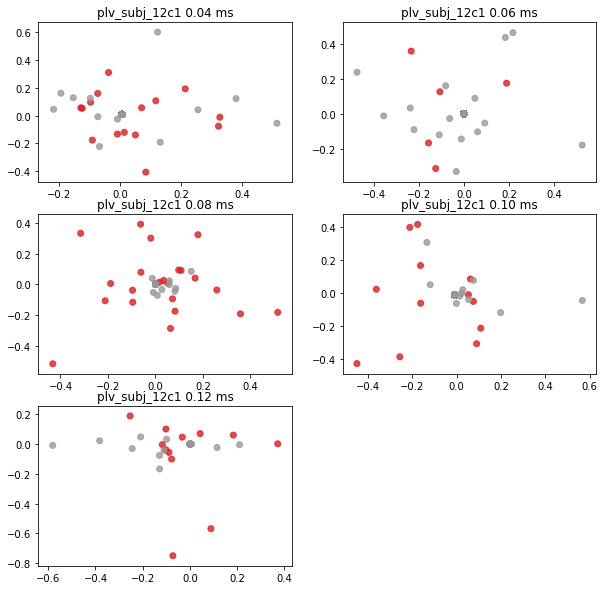

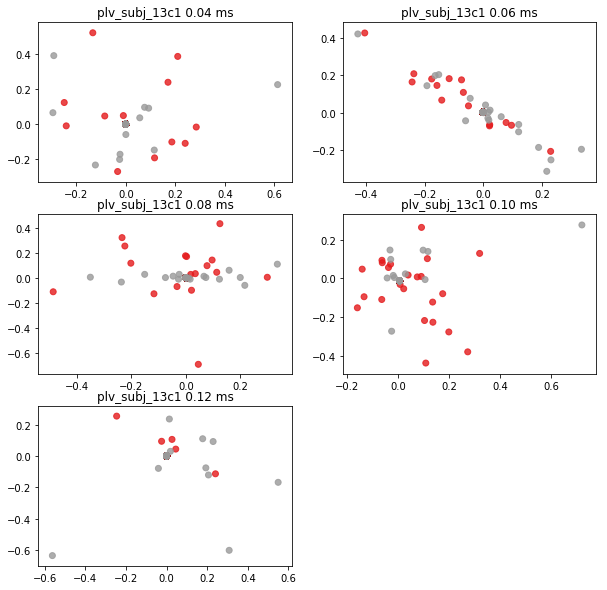

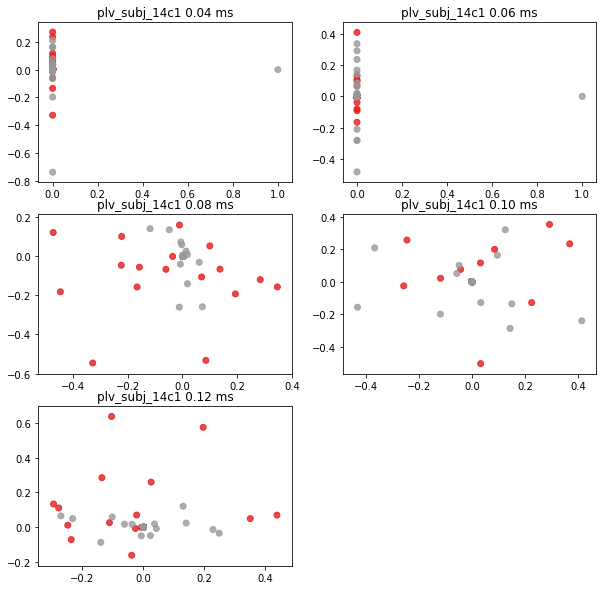

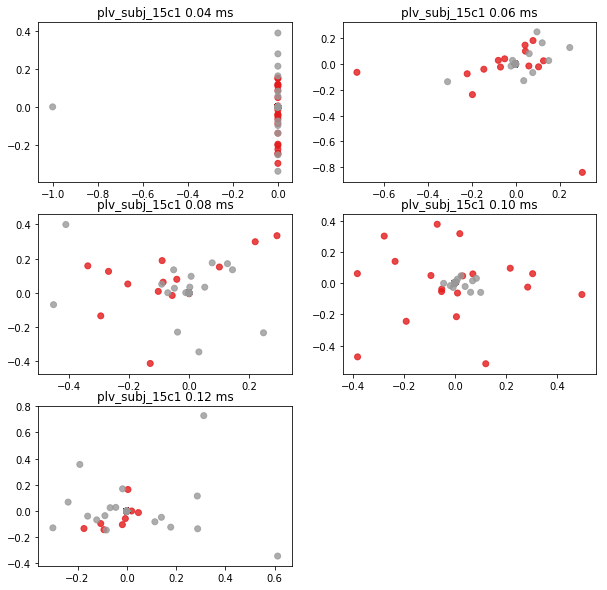

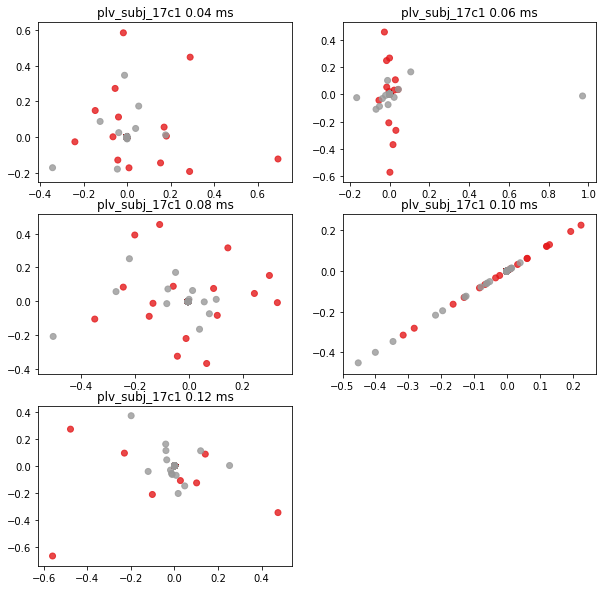

In [440]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_patients_beta_noselec_p50_Cz.mat'

filecontents = sio.whosmat(matfile)

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    plt.figure(figsize=(10,10))
    
    for k,tpoint in enumerate(range(12,17)):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1

        X = (np.vstack([p50_cz_iso_std,p50_cz_rnd_std]))

        ####


        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding


        n_neighbors = 8
        n_components = 2

        #Y = Isomap(n_neighbors=n_neighbors,n_components=n_components).fit_transform(X)

        #Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='auto').fit_transform(X)

        #plt.scatter(Y[:, 0], Y[:, 1],c=y)
        #plt.title('ISOMAP')

        plt.subplot(3,2,k+1)

        #Y = MDS(n_components=n_components,metric=False).fit_transform((X))


        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components).fit_transform(X)
        Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense').fit_transform(X)

        plt.scatter(Y[:, 0], Y[:, 1],c=y,alpha=0.8,cmap=plt.cm.Set1)
        plt.title('%s %0.2f ms' % (current_subj,tpoint_ms))

Learning 3D projections
--

Red points : REGULAR 

Grey points : IRREGULAR

In [426]:
from mpl_toolkits.mplot3d import Axes3D

Controls

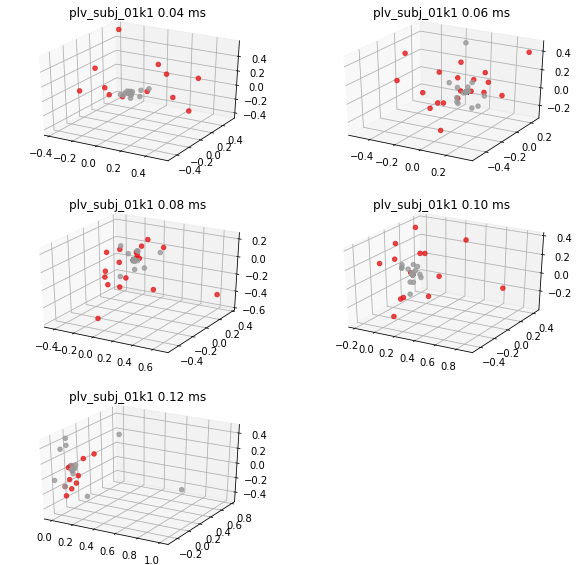

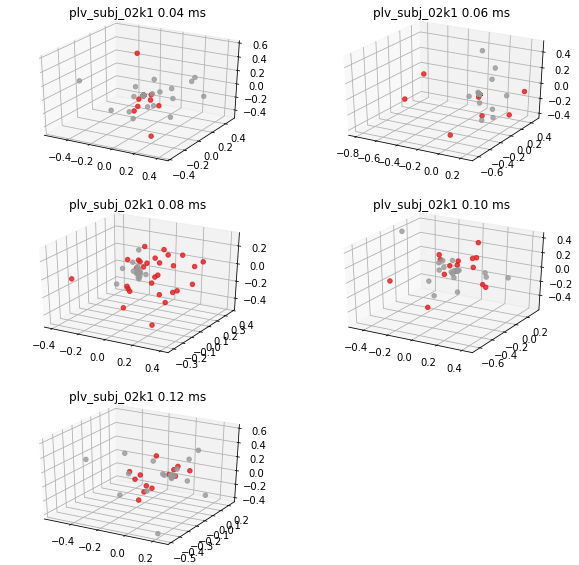

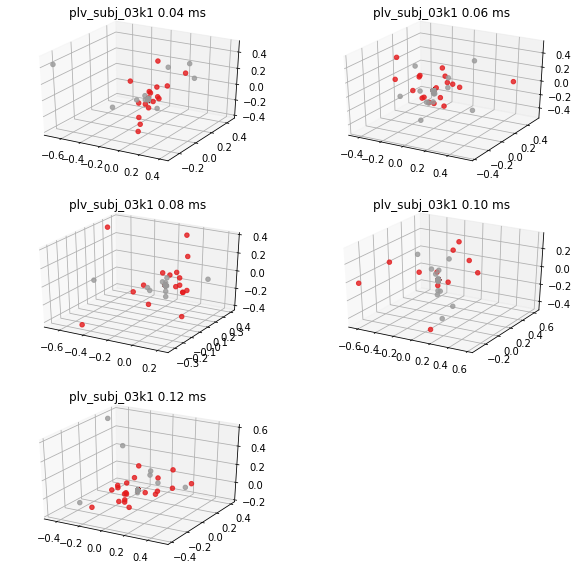

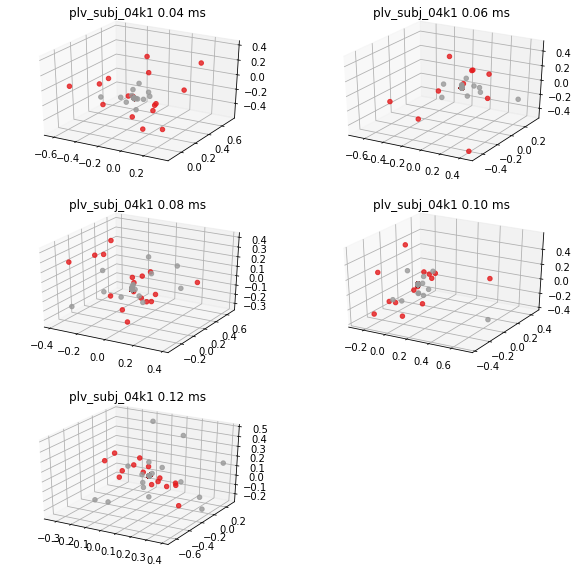

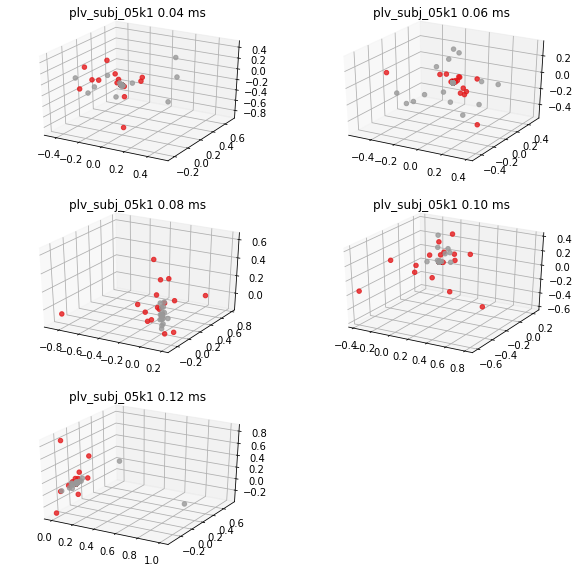

...

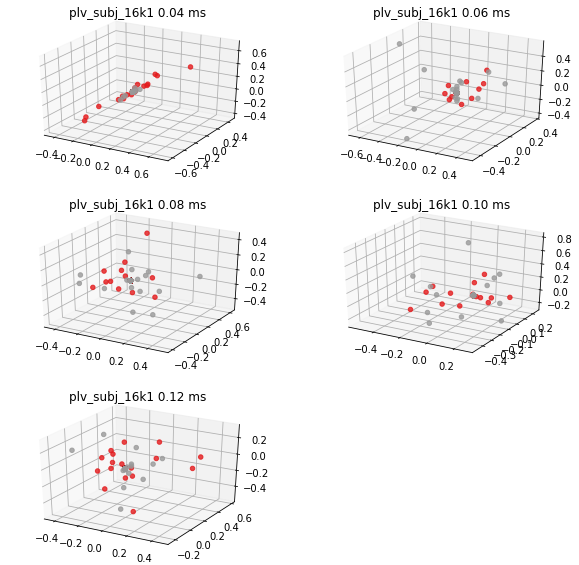

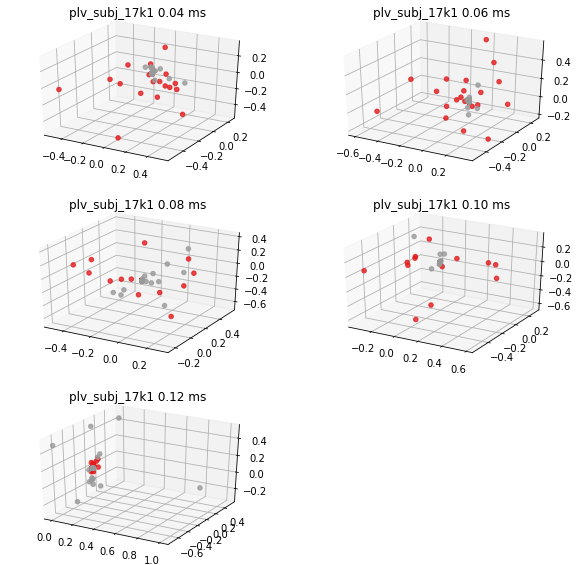

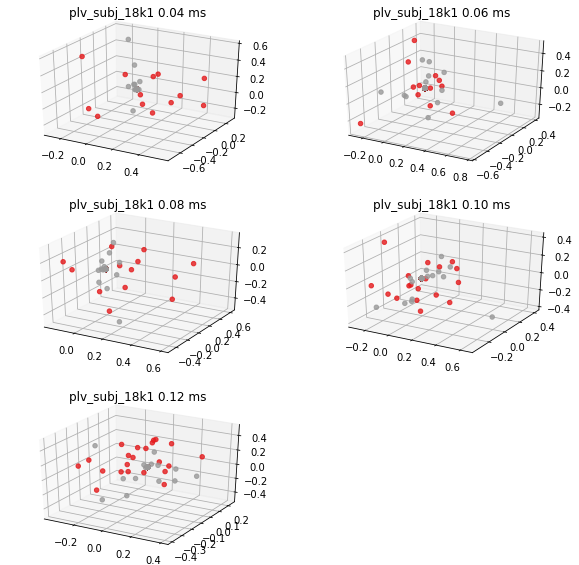

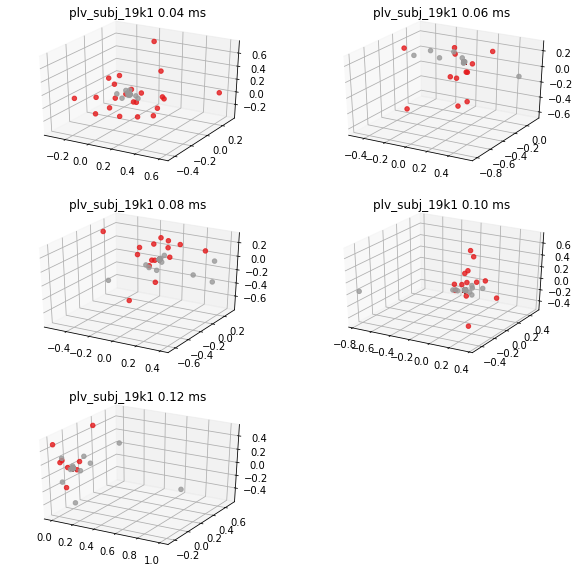

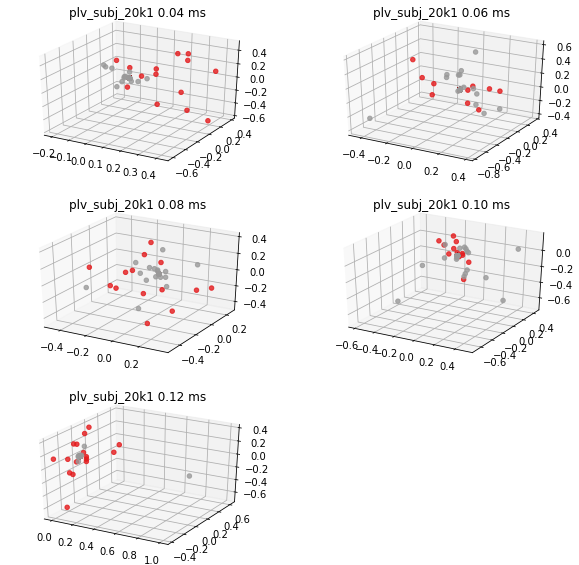

In [438]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_probands_beta_noselec_p50_Cz.mat'

filecontents = sio.whosmat(matfile)

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    fig = plt.figure(figsize=(10,10))
    
    for k,tpoint in enumerate(range(12,17)):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1

        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))


        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        n_neighbors = 8
        n_components = 3

        ax = fig.add_subplot(3,2,k+1,projection='3d')


        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
        Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense').fit_transform(X)

        ax.scatter(Y[:, 0], Y[:, 1],Y[:,2],c=y,alpha=0.8,cmap=plt.cm.Set1)
        plt.title('%s %0.2f ms' % (current_subj,tpoint_ms))

Patients

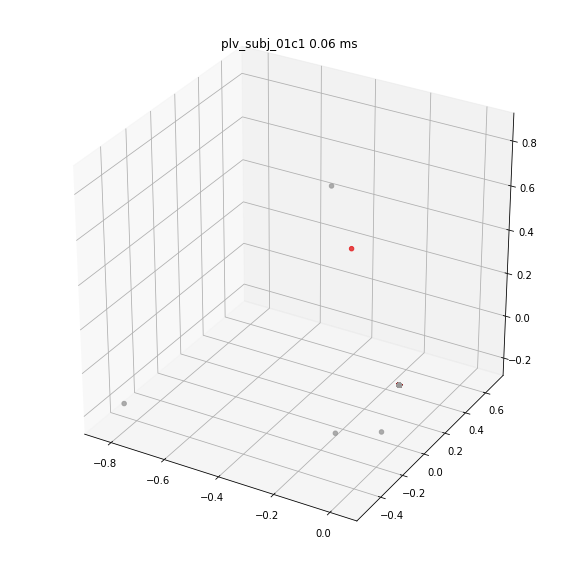

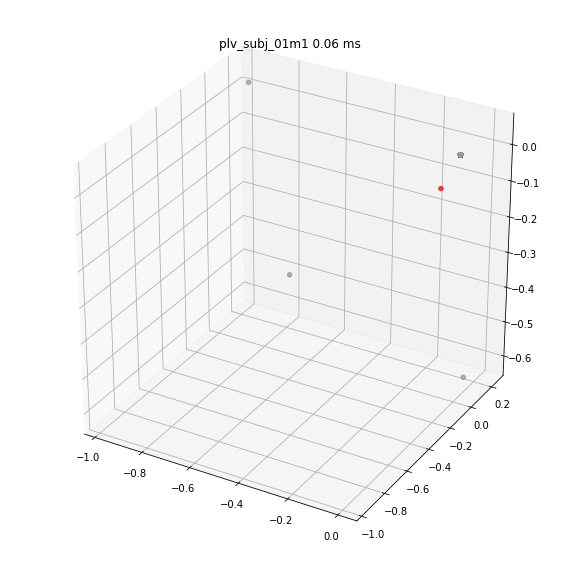

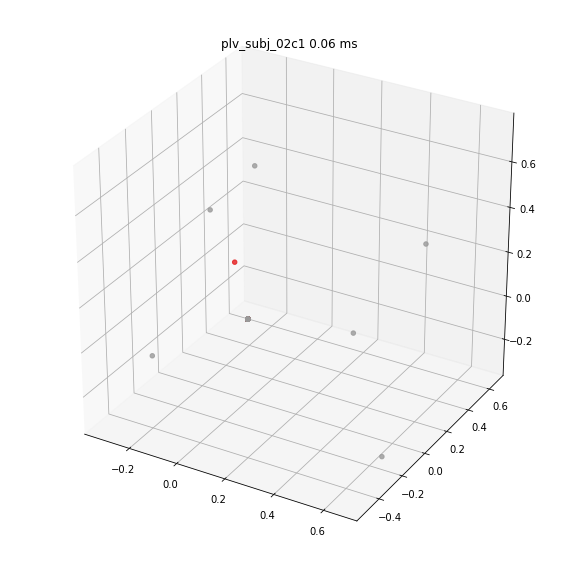

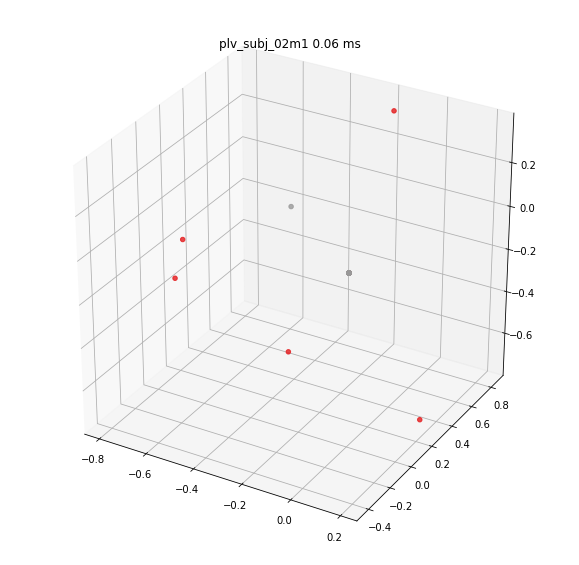

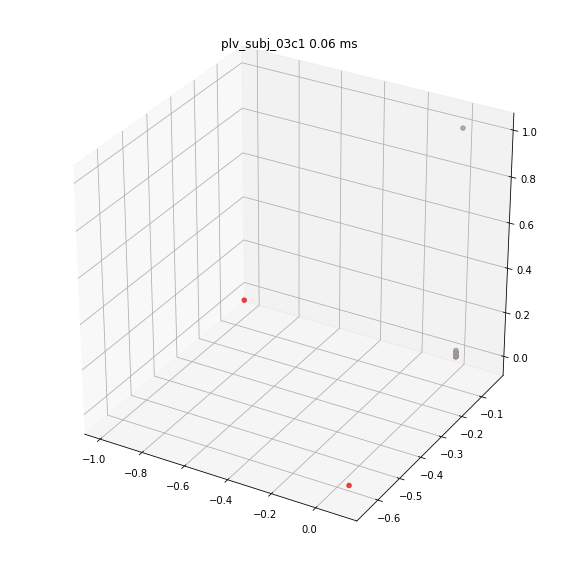

...

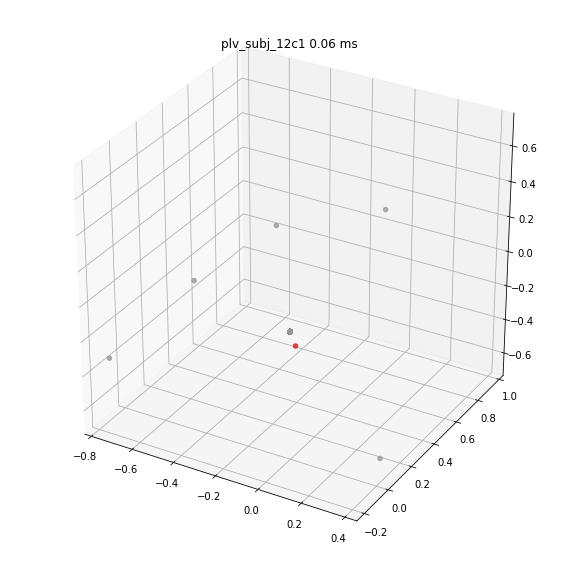

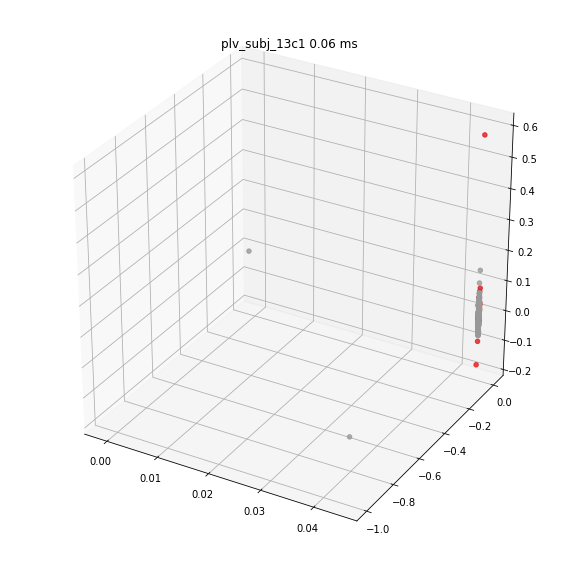

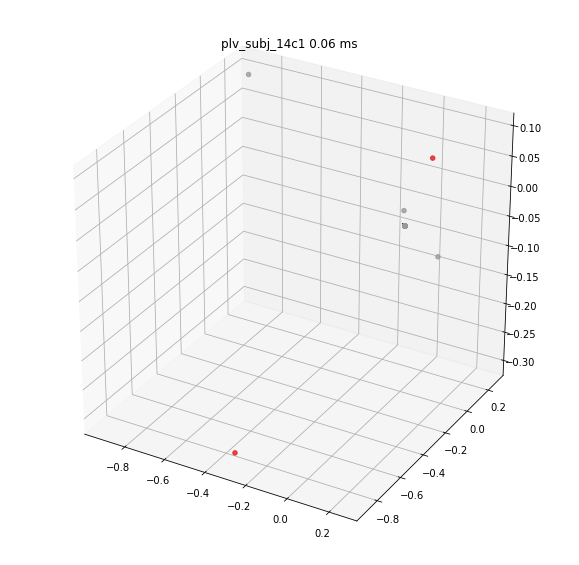

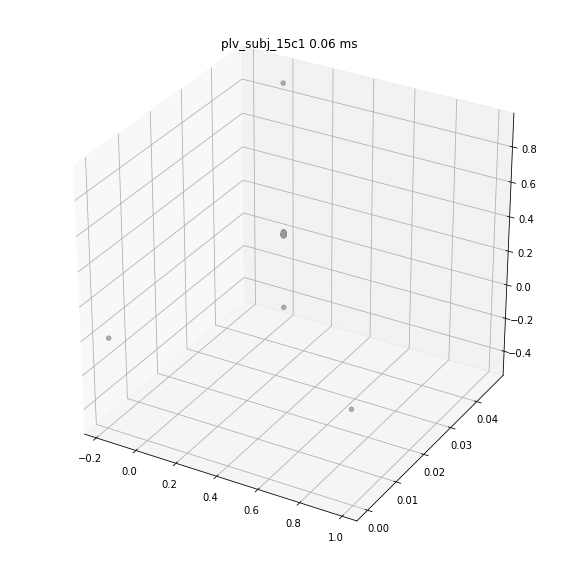

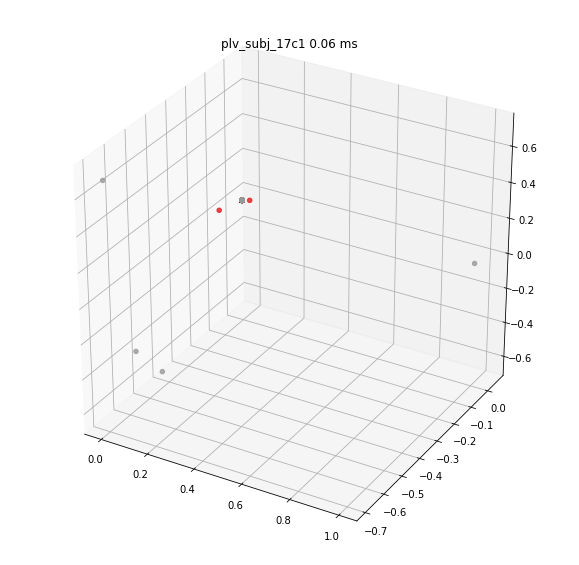

In [507]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_patients_beta_noselec_p50_Cz.mat'

filecontents = sio.whosmat(matfile)

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    fig = plt.figure(figsize=(10,10))
    
    for k,tpoint in enumerate([13,]):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1


        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))


        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        n_neighbors = 8
        n_components = 3

        ax = fig.add_subplot(1,1,k+1,projection='3d')


        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
        Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense').fit_transform(X)

        ax.scatter(Y[:, 0], Y[:, 1],Y[:,2],c=y,alpha=0.8,cmap=plt.cm.Set1)
        plt.title('%s %0.2f ms' % (current_subj,tpoint_ms))

Clustering tests using the whole group at once
--
to be continued - not stable yet 

/Users/nicolasfarrugia/miniconda3/envs/tf/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyboardInterrupt: 

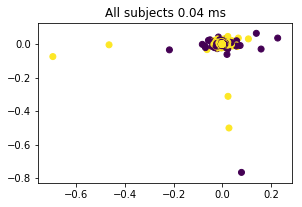

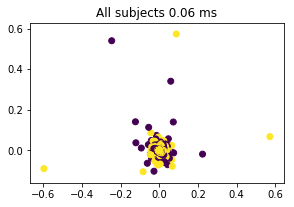

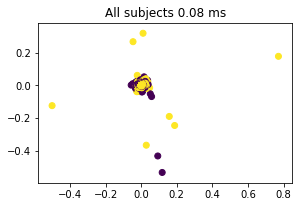

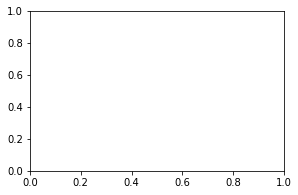

In [397]:
from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding

for k,tpoint in enumerate(range(12,17)):
    X_all = []
    y_all = []
    plt.figure(figsize=(10,10))
    
    for cursubjname in filecontents:
    
        current_subj = (cursubjname[0])
        subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
        

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        
        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1

        X = (np.vstack([p50_cz_iso_std,p50_cz_rnd_std]))
        
        X_all.append(X)
        y_all.append(y)
        
    
    
    

    X_all = np.vstack(X_all)
    y_all = np.hstack(y_all)
    
    n_neighbors = 5
    n_components = 2

    #Y = Isomap(n_neighbors=n_neighbors,n_components=n_components).fit_transform(X)

    #Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='auto').fit_transform(X)

    #plt.scatter(Y[:, 0], Y[:, 1],c=y)
    #plt.title('ISOMAP')

    plt.subplot(3,2,k+1)

    #Y = MDS(n_components=n_components,metric=False).fit_transform((X))


    Y = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense').fit_transform(X_all)

    plt.scatter(Y[:, 0], Y[:, 1],c=y_all,alpha=1)
    plt.title('All subjects %0.2f ms' % (tpoint_ms))

Next steps : 
1. Define a quantitative measure to estimate the sufficient number of dimensions 
2. Focus on the 60 ms centered time-window as a start 
3. Estimate the quality of separation by running a first supervised learning task (SVM)


About the weird cases : 
1. Take a look at them - does it happen in both 2D and 3D ? 
2. Look at the source data - add a rose plot / phase histogram 

Finding the minimum number of dimensions 
--

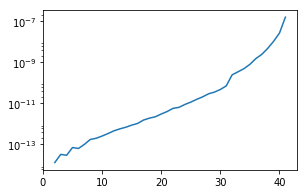

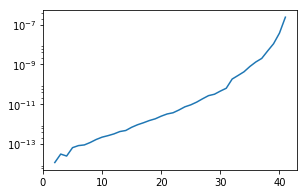

In [556]:
from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_probands_beta_noselec_p50_Cz.mat'

filecontents = sio.whosmat(matfile)

for cursubjname in filecontents[:2]:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    fig = plt.figure(figsize=(10,10))
    
    for k,tpoint in enumerate([15,]):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1

        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))
        
        errors = []
        for n_components in range(2,42):
        


            n_neighbors = n_components+1

            #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
            #lle = MDS(n_components=n_components)

            lle = LocallyLinearEmbedding(n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense')

            lle.fit(X)

            errors.append(lle.reconstruction_error_)

    
        plt.subplot(3,2,k+1)
        plt.semilogy(range(2,42),np.abs(errors))
        

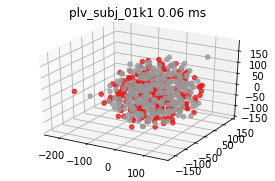

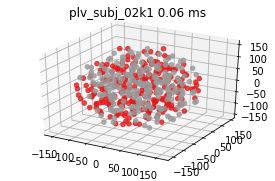

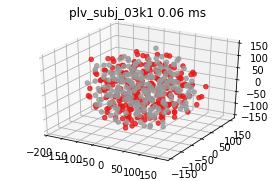

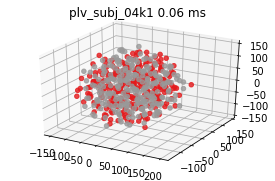

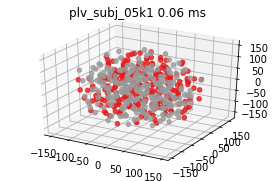

...

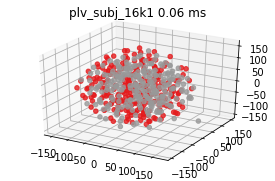

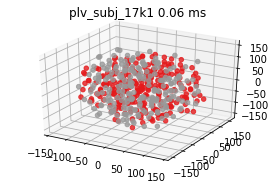

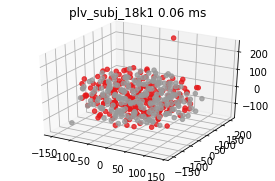

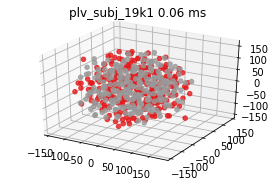

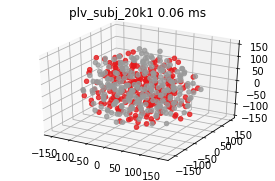

In [522]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_probands_beta_noselec_p50_Cz.mat'

filecontents = sio.whosmat(matfile)

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    fig = plt.figure(figsize=(10,10))
    
    for k,tpoint in enumerate([13,]):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1
        
        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))

        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        n_neighbors = 8
        n_components = 3

        ax = fig.add_subplot(3,2,k+1,projection='3d')


        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
        Y = TSNE(n_components=3).fit_transform(X)

        ax.scatter(Y[:, 0], Y[:, 1],Y[:,2],c=y,alpha=0.8,cmap=plt.cm.Set1)
        plt.title('%s %0.2f ms' % (current_subj,tpoint_ms))


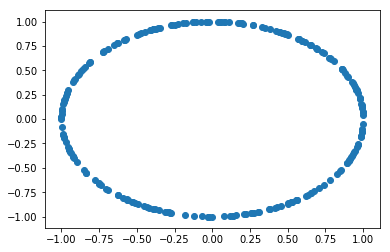

In [536]:
cur_freq = 17
plt.scatter(iso_cart[:,cur_freq],iso_cart[:,cur_freq+21])
#plt.scatter(rnd_cart[:,cur_freq],rnd_cart[:,cur_freq+21])



/Users/nicolasfarrugia/miniconda3/envs/tf/lib/python3.6/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


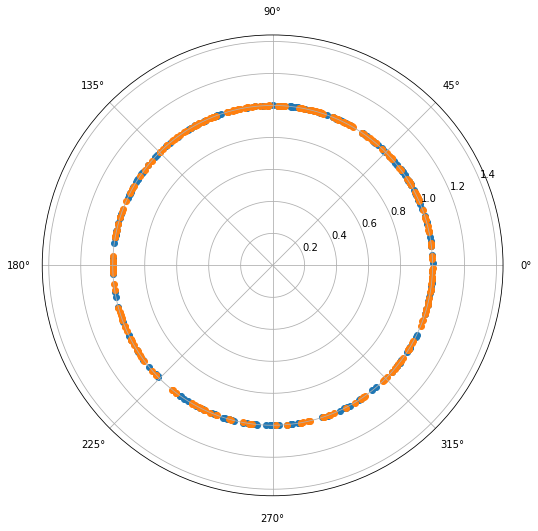

In [18]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)

ax.scatter(p50_cz_iso_std[:,1],np.ones(n_iso))
ax.scatter(p50_cz_rnd_std[:,1],np.ones(n_rnd))

fig.show()

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score




What happens if we do the dimensionality reduction and train a SVM right after ? 



In [16]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_probands_beta_noselec_p50_Cz.mat'


filecontents = sio.whosmat(matfile)

all_acc = []

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    
    for k,tpoint in enumerate([13,]):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1
        
        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))


        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        n_neighbors = 8
        n_components = 6



        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
        Y = LocallyLinearEmbedding(n_neighbors=n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense').fit_transform(X)

        
        from sklearn.neighbors import KNeighborsClassifier

        knn = KNeighborsClassifier(n_neighbors)
        
        #mysvm = SVC(kernel='rbf')


        X_train, X_test, y_train, y_test = train_test_split(Y,y,test_size = 0.2)

        knn.fit(X_train,y_train)


        acc = accuracy_score(y_test,knn.predict(X_test))


        print('%s %0.2f ms, classif %0.2f' % (current_subj,tpoint_ms,acc))

plv_subj_01k1 0.06 ms, classif 0.56
plv_subj_02k1 0.06 ms, classif 0.54
plv_subj_03k1 0.06 ms, classif 0.52
plv_subj_04k1 0.06 ms, classif 0.49
plv_subj_05k1 0.06 ms, classif 0.49
plv_subj_06k1 0.06 ms, classif 0.55
plv_subj_07k1 0.06 ms, classif 0.44
plv_subj_08k1 0.06 ms, classif 0.42
plv_subj_09k1 0.06 ms, classif 0.48
plv_subj_10k1 0.06 ms, classif 0.49
plv_subj_11k1 0.06 ms, classif 0.43
plv_subj_12k1 0.06 ms, classif 0.49
plv_subj_13k1 0.06 ms, classif 0.51
plv_subj_14k1 0.06 ms, classif 0.59
plv_subj_15k1 0.06 ms, classif 0.51
plv_subj_16k1 0.06 ms, classif 0.45
plv_subj_17k1 0.06 ms, classif 0.45
plv_subj_18k1 0.06 ms, classif 0.36
plv_subj_19k1 0.06 ms, classif 0.50
plv_subj_20k1 0.06 ms, classif 0.51


In [15]:
matfile = '/Users/nicolasfarrugia/Documents/recherche/PD/PDNewAnalysis/spectrum-beta-29feb2016/2017/wideband/data_patients_beta_noselec_p50_Cz.mat'
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from sklearn.manifold import LocallyLinearEmbedding
from sklearn.neighbors import KNeighborsClassifier

filecontents = sio.whosmat(matfile)

all_acc = []

for cursubjname in filecontents:
    current_subj = (cursubjname[0])
    subjdata = sio.loadmat(matfile,variable_names=current_subj,struct_as_record = False,squeeze_me=True)[current_subj]
    
    for k,tpoint in enumerate([13,]):

        tpoint_ms = subjdata.all.iso.standard.time[tpoint]
        p50_cz_iso_std = subjdata.all.iso.standard.ang[:,2,:,tpoint]
        p50_cz_rnd_std = subjdata.all.rnd.standard.ang[:,2,:,tpoint]

        #print("Examining at %0.2f ms" % tpoint_ms)

        n_iso = p50_cz_iso_std.shape[0]
        n_rnd = p50_cz_rnd_std.shape[0]
        #print(n_iso,n_rnd)

        y = 2*np.ones(n_iso+n_rnd)
        y[0:n_iso]=1
        
        iso_cart = np.hstack([np.cos(p50_cz_iso_std),np.sin(p50_cz_iso_std)])
        rnd_cart = np.hstack([np.cos(p50_cz_rnd_std),np.sin(p50_cz_rnd_std)])

        X = (np.vstack([iso_cart,rnd_cart]))


        from sklearn.manifold import LocallyLinearEmbedding,Isomap,MDS,TSNE,SpectralEmbedding
        n_neighbors = 8
        n_components = 6



        #Y = SpectralEmbedding(n_neighbors=n_neighbors,n_components=n_components,affinity='rbf').fit_transform(X)
        Y = LocallyLinearEmbedding(n_neighbors=n_neighbors,n_components=n_components,method='ltsa',eigen_solver='dense').fit_transform(X)

        
        from sklearn.neighbors import KNeighborsClassifier

        knn = KNeighborsClassifier(n_neighbors)
        
        #mysvm = SVC(kernel='rbf')


        X_train, X_test, y_train, y_test = train_test_split(Y,y,test_size = 0.2)

        knn.fit(X_train,y_train)


        acc = accuracy_score(y_test,knn.predict(X_test))


        print('%s %0.2f ms, classif %0.2f' % (current_subj,tpoint_ms,acc))

plv_subj_01c1 0.06 ms, classif 0.49
plv_subj_01m1 0.06 ms, classif 0.52
plv_subj_02c1 0.06 ms, classif 0.45
plv_subj_02m1 0.06 ms, classif 0.48
plv_subj_03c1 0.06 ms, classif 0.55
plv_subj_03m1 0.06 ms, classif 0.59
plv_subj_04c1 0.06 ms, classif 0.53
plv_subj_04m1 0.06 ms, classif 0.47
plv_subj_05c1 0.06 ms, classif 0.63
plv_subj_06c1 0.06 ms, classif 0.54
plv_subj_07c1 0.06 ms, classif 0.54
plv_subj_08c1 0.06 ms, classif 0.56
plv_subj_09c1 0.06 ms, classif 0.62
plv_subj_10c1 0.06 ms, classif 0.52
plv_subj_11c1 0.06 ms, classif 0.55
plv_subj_12c1 0.06 ms, classif 0.56
plv_subj_13c1 0.06 ms, classif 0.46
plv_subj_14c1 0.06 ms, classif 0.55
plv_subj_15c1 0.06 ms, classif 0.47
plv_subj_17c1 0.06 ms, classif 0.45
